Gerar um modelo de detecção de objeto customizado para detectar as seguintes classes:

**['Hardhat', 'Mask', 'NO-Hardhat', 'NO-Mask', 'NO-Safety Vest', 'Person', 'Safety Cone', 'Safety Vest', 'machinery', 'vehicle']** using YoloV8.


# **1. Importando bibliotecas**
- `os` e `glob` para acessar diretórios de arquivos
- `numpy` para operações com arrays
- `pandas` para dataframes, criação de metadados
- `PIL` e `cv2` para operações e visualização de imagens
- `matplotlib` para plotar resultados e distribuições de classes

In [2]:
!pip install PyQT6
!pip install ultralytics

In [3]:
%matplotlib inline
import os, glob
import tqdm
import numpy as np
import pandas as pd
from PIL import Image
import cv2
import sys
import matplotlib.pyplot as plt
from ultralytics import YOLO
from PyQt6.QtWidgets import QApplication, QWidget, QLabel, QPushButton, QVBoxLayout, QMessageBox
from PyQt6.QtGui import QImage, QPixmap
from PyQt6.QtCore import QTimer
import warnings
warnings.filterwarnings('ignore')

Todos os caminhos de diretórios são definidos no início do código para facilitar a manutenção e reutilização do código.

In [4]:
# Data path
data_path = 'datasets/css_data'
# Train, Valid and Test path
train_path = os.path.join(data_path, 'train')
valid_path = os.path.join(data_path, 'valid')
test_path = os.path.join(data_path, 'test')
# For saving results
output_path = '/kaggle/working'
# We can access both images and labels
folders = ['images', 'labels']
print("Data Path: {}\nTrain Path: {}\nValid Path: {}\nTest Path: {}\nOutput Path: {}".format(data_path, train_path, valid_path, test_path, output_path))

Data Path: datasets/css_data
Train Path: datasets/css_data\train
Valid Path: datasets/css_data\valid
Test Path: datasets/css_data\test
Output Path: /kaggle/working


Metadata - Vamos criar um arquivo csv contendo todas as informações sobre as imagens, como caminho, largura, altura, classe, etc. Isso facilitará a leitura e a manipulação dos dados.

In [5]:
# Initialize dictionaries of training and classes
train_dict = dict(train=0, valid=1, test=2)
path_dict = [train_path, valid_path, test_path]
class_names = ['Hardhat', 'Mask', 'NO-Hardhat', 'NO-Mask', 'NO-Safety Vest', 'Person', 'Safety Cone', 'Safety Vest', 'machinery', 'vehicle']
class_dict = dict(zip(range(len(class_names)), class_names))
print(class_dict)

{0: 'Hardhat', 1: 'Mask', 2: 'NO-Hardhat', 3: 'NO-Mask', 4: 'NO-Safety Vest', 5: 'Person', 6: 'Safety Cone', 7: 'Safety Vest', 8: 'machinery', 9: 'vehicle'}


In [6]:
## Obter informações de nomes de arquivos e rótulos
# Ordenar os nomes dos arquivos para que os rótulos e as imagens fiquem na mesma ordem
# train_filenames = sorted(os.listdir(os.path.join(train_path, folders[0])))
# valid_filenames = sorted(os.listdir(os.path.join(valid_path, folders[0])))
# test_filenames = sorted(os.listdir(os.path.join(test_path, folders[0])))
# train_labels = sorted(os.listdir(os.path.join(train_path, folders[1])))
# valid_labels = sorted(os.listdir(os.path.join(valid_path, folders[1])))
# test_labels = sorted(os.listdir(os.path.join(test_path, folders[1])))

#Versão reduzida com list comprehension
train_filenames, valid_filenames, test_filenames = [sorted(os.listdir(os.path.join(path_dict[i], folders[0]))) for i in range(len(path_dict))]
train_labels, valid_labels, test_labels = [sorted(os.listdir(os.path.join(path_dict[i], folders[1]))) for i in range(len(path_dict))]

 ## ⬜ Verifique estas coisas
1. O comprimento dos **nomes de arquivos de treinamento/validação/teste** é o mesmo que o dos **rótulos de treinamento/validação/teste**

2. A ordem dos **nomes de arquivos de treinamento/validação/teste** é a mesma que a dos **rótulos de treinamento/validação/teste**

3. Vazamento de arquivos e entradas duplicadas nos **nomes de arquivos de treinamento/validação/teste**

### ✅ Verificar comprimentos

In [7]:
# Return lengths of all filenames
print("Total Train Files: {}\nTotal Valid Files: {}\nTotal Test Files:{}".format(len(train_filenames), len(valid_filenames), len(test_filenames)))

Total Train Files: 2605
Total Valid Files: 114
Total Test Files:82


In [8]:
# Check whether filenames and labels are of same length
len(train_filenames)==len(train_labels), len(valid_filenames)==len(valid_labels), len(test_filenames)==len(test_labels)

(True, True, True)

 ### ✅ Verificar Ordem
Vamos verificar a ordem dos nomes de arquivos e rótulos para garantir que cada imagem tenha o mesmo nome de anotação de rótulo que a imagem correspondente. Isso garantirá que não estamos usando informações de anotações e rótulos para uma imagem diferente.

In [9]:
# Check order in filenames and labels in all splits
[item.split('.')[0] for item in train_filenames]==[item.split('.')[0] for item in train_labels],\
[item.split('.')[0] for item in valid_filenames]==[item.split('.')[0] for item in valid_labels],\
[item.split('.')[0] for item in test_filenames]==[item.split('.')[0] for item in test_labels]

(True, True, True)

### ✅ Check Leakage
Verificaremos se algum nome de arquivo está presente em mais de um conjunto. Isso é conhecido como vazamento em conjuntos de dados. Se alguns nomes de arquivos forem comuns em mais de um conjunto, como treinamento ou validação, o treinamento não será confiável.

Muitas vezes, grandes conjuntos de dados de diferentes competições têm anotadores manuais. Devemos sempre verificar essas três coisas antes de prosseguir com a EDA ou pré-processamento.

In [10]:
set(train_filenames).intersection(set(valid_filenames)),\
set(valid_filenames).intersection(set(test_filenames)),\
set(test_filenames).intersection(set(train_filenames))

(set(), set(), set())

In [11]:
df = pd.DataFrame()
df['filenames'] = train_filenames + valid_filenames + test_filenames
df['labelnames'] = train_labels + valid_labels + test_labels
df['train_id'] = [0]*len(train_filenames) + [1]*len(valid_filenames) + [2]*len(test_filenames)

In [12]:
df.head()

,filenames,labelnames,train_id
0,-1670-_png_jpg.rf.0463edb430019e01ec79eed27a63...,-1670-_png_jpg.rf.0463edb430019e01ec79eed27a63...,0
1,-1670-_png_jpg.rf.3cb172ea2c4165c19ae2dd498b38...,-1670-_png_jpg.rf.3cb172ea2c4165c19ae2dd498b38...,0
2,-1670-_png_jpg.rf.7da967f9aeaa62defc36543b9e60...,-1670-_png_jpg.rf.7da967f9aeaa62defc36543b9e60...,0
3,-1670-_png_jpg.rf.b42b26d784545ce1a033679674a4...,-1670-_png_jpg.rf.b42b26d784545ce1a033679674a4...,0
4,-1670-_png_jpg.rf.dd5cb0a4d6da02d34f1dc003fb4e...,-1670-_png_jpg.rf.dd5cb0a4d6da02d34f1dc003fb4e...,0


### ✅ Verificar entradas duplicadas

In [13]:
# No duplicate entries found
df.filenames.duplicated().value_counts()

filenames
False    2801
Name: count, dtype: int64

In [14]:
# Count of train valid and test sets
df.train_id.value_counts()

train_id
0    2605
1     114
2      82
Name: count, dtype: int64

<Axes: title={'center': 'Train-Val-Test Split'}, xlabel='train_id'>

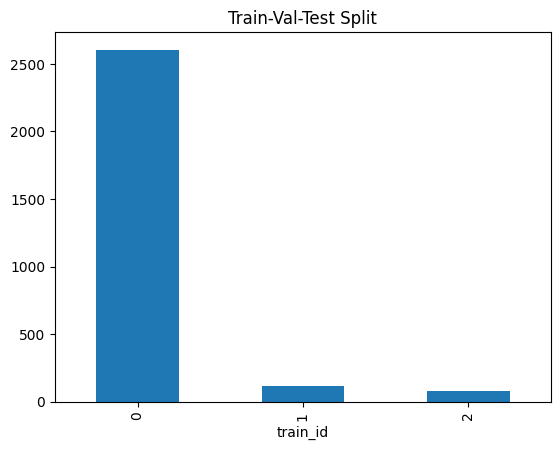

In [15]:
df.train_id.value_counts().plot(kind = 'bar', title = 'Train-Val-Test Split')

## Visualize Class Distribution
Neste conjunto de dados, cada imagem geralmente consiste em mais de uma anotação de classe. Portanto, precisamos verificar o número total de anotações em cada imagem para então visualizar uma distribuição geral das classes.

Existem três casos quando lemos o arquivo de anotação.

**1. O arquivo de anotação está vazio.**

`len(annotation)===0`
Vamos pular esses arquivos durante o treinamento e avaliação do nosso modelo de detecção de objetos.

**2. O arquivo de anotação possui apenas uma anotação.**

`len(annotation.shape)==1`
Vamos remodelar o array e obter as anotações.

**3. O arquivo de anotação possui várias anotações.**

`len(annotation)>1`
Vamos obter as anotações diretamente.

In [16]:
# Split list
train_keys = list(train_dict.keys())

In [17]:
# Complete path for annotation_files
annotation_files = (data_path + '/' + df.train_id.map(lambda x: train_keys[x]) + '/' + folders[1]
                    + '/' + df.labelnames).tolist()
t_id = df.train_id.tolist()
counts = []
invalid_idx = []
is_annotated = []
for idx, annotation_file in tqdm.tqdm(enumerate(annotation_files)):
    annotation = np.loadtxt(annotation_file)
    if len(annotation)==0:
        invalid_idx.append(idx)
        is_annotated.append(-1)
        counts.append([])
        continue
    if len(annotation.shape)==1:
        annotation = annotation.reshape(1, -1)
    counts.append(annotation[:,0].astype(int))
    is_annotated.append(1)
df['is_annotated'] = is_annotated

2801it [00:23, 117.02it/s]


In [18]:
df.is_annotated.value_counts()

is_annotated
 1    2777
-1      24
Name: count, dtype: int64

In [19]:
# Create a count_dict which holds class counts per split (train/valid/test)
count_list = [np.unique(item, return_counts = True) for item in counts]
count_keys = [item[0] for item in count_list]
count_values = [item[1] for item in count_list]
count_dict = []
for ck,cv in zip(count_keys, count_values):
    count_dict.append(dict([(key,value) for key, value in zip(ck,cv)]))
df['count_dict'] = count_dict

In [20]:
from collections import Counter
train_count = df[df.train_id==0].count_dict.apply(lambda x: Counter(x)).sum()
valid_count = df[df.train_id==1].count_dict.apply(lambda x: Counter(x)).sum()
test_count = df[df.train_id==2].count_dict.apply(lambda x: Counter(x)).sum()

In [21]:
# We will normalize the counts to get a correct visualization, since there is huge difference
# between the counts of train valid and test splits
train_count = {key:value/sum(train_count.values()) for key, value in train_count.items()}
valid_count = {key:value/sum(valid_count.values()) for key, value in valid_count.items()}
test_count = {key:value/sum(test_count.values()) for key, value in test_count.items()}

In [22]:
print("Train Class Distribution Dict: {}\n\nValid Class Distribution Dict: {}\n\nTest Class Distribution Dict: {}"
     .format(train_count, valid_count, test_count))

Train Class Distribution Dict: {0: 0.08524190269684238, 1: 0.04474861092288928, 2: 0.06279983737633826, 3: 0.08394091340290012, 5: 0.2583547906220355, 4: 0.10738582463748475, 7: 0.0822062610109771, 8: 0.14221439219406423, 6: 0.09123187423770159, 9: 0.04187559289876677}

Valid Class Distribution Dict: {0: 0.1133428981348637, 3: 0.10616929698708752, 4: 0.15208034433285508, 5: 0.2381635581061693, 7: 0.058823529411764705, 2: 0.09899569583931134, 1: 0.03012912482065997, 6: 0.06312769010043041, 8: 0.07890961262553801, 9: 0.06025824964131994}

Test Class Distribution Dict: {0: 0.14473684210526316, 3: 0.10394736842105264, 4: 0.11842105263157894, 5: 0.22894736842105262, 6: 0.12105263157894737, 9: 0.05394736842105263, 2: 0.05394736842105263, 7: 0.08026315789473684, 8: 0.05789473684210526, 1: 0.03684210526315789}


In [23]:
df_count = pd.DataFrame()
df_count = pd.DataFrame({'train':train_count, 'valid': valid_count, 'test': test_count}).sort_index()

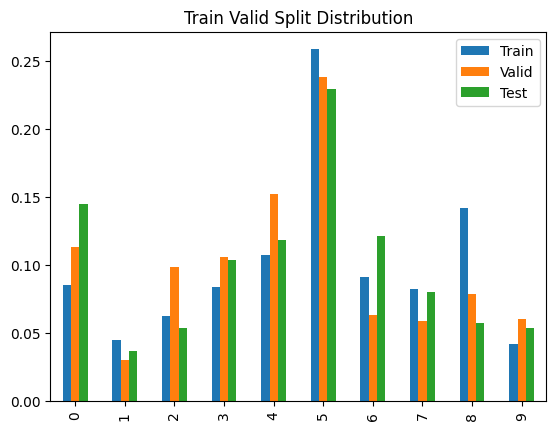

In [24]:
df_count['idx'] = pd.Series(df_count.index)
df_count.plot(y = ['train', 'valid', 'test'], kind = 'bar', title = 'Train Valid Split Distribution')
plt.legend(['Train', 'Valid', 'Test'])

Podemos ver que as contagens normalizadas de todas as classes estão mais ou menos balanceadas, o que garantirá que não veremos algumas classes com mais frequência do que outras durante o treinamento, já que a distribuição é praticamente a mesma entre todas as classes (em todas as divisões).


# Visualizar Amostras

Vamos visualizar algumas amostras do conjunto de dados e suas anotações. Como temos todas as anotações no formato YoloV8, começaremos convertendo esses arquivos de anotações para coordenadas de caixas delimitadoras (bounding boxes).

O formato de anotação YoloV8 tem 5 entradas em cada linha do arquivo `.txt`:
- Rótulo da Classe (c)
- Centro da Caixa Delimitadora (Coordenada X)
- Centro da Caixa Delimitadora (Coordenada Y)
- Largura da Caixa Delimitadora (w)
- Altura da Caixa Delimitadora (h)

As coordenadas da caixa delimitadora podem ser calculadas a partir das últimas 4 entradas no arquivo de anotação.

In [25]:
def yolo_annotation_to_bbox(annotation, img_height, img_width):
    """
    Converts Yolo annotations to bounding box coordinates
    Input:
    annotation: str, annotation file in .txt format
    img_height: int, image height
    img_width: int, image width
    Output:
    class: list, List of labels in the image
    bbox_list: list, List of bounding boxes in an image
    """
    sh = annotation.shape
    if len(sh)==0:
        print("No bounding box found")
    if len(sh)==1:
        annotation = annotation.reshape(1, -1)
    num_bbox = len(annotation)
    bbox_list = []
    for idx in range(num_bbox):
        c_x, c_y, w, h = annotation[idx][1:]
        x1 = ((c_x - w/2)*img_width).astype(int)
        x2 = ((c_x + w/2)*img_width).astype(int)
        y1 = ((c_y - h/2)*img_height).astype(int)
        y2 = ((c_y + h/2)*img_height).astype(int)
        bbox_list.append([x1, y1, x2, y2])
    return bbox_list

In [26]:
### invalid_files = (data_path + '/' + df.train_id[invalid_idx].apply(lambda x: train_keys[x]) + '/' + folders[0] + '/' + df.filenames[invalid_idx])
invalid_files = df.filenames[invalid_idx]
def visualize_samples(mode = 'train', n_samples = 12):
    """
    Plots 'n_samples' plots from train/valid/test split
    Input:
    mode: 'str' can take values from 'train'/'valid','test'
    n_samples: 'int'
    """
    # We will visualize only those files which have annotations 
    indices = df[(~df.filenames.isin(invalid_files))&(df.train_id==1)].sample(n_samples).index
    filenames = (data_path + '/' + df.train_id[indices].apply(lambda x: train_keys[x]) + '/' + folders[0] + '/' + df.filenames[indices]).tolist()
    annotations = (data_path + '/' + df.train_id[indices].apply(lambda x: train_keys[x]) + '/' + folders[1] + '/' + df.labelnames[indices]).tolist()
    plt.figure(figsize = (21, 11))
    plt.title('{} Set Samples'.format(mode.upper()))
    for idx in range(len(filenames)):
        image = np.array(Image.open(filenames[idx]))
        height, width, _ = image.shape 
        annotation = np.loadtxt(annotations[idx])
        bbox_list = yolo_annotation_to_bbox(annotation, height, width)
        if len(annotation.shape)==1:
            annotation = annotation.reshape(1, -1)
        labels = [class_dict[item] for item in annotation[:,0].astype(int)]
        plt.subplot(3, 4, idx + 1)
        for label, bbox in zip(labels, bbox_list):
            x1, y1, x2, y2 = bbox
            cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)
            cv2.putText(image, label, (x1, y1-5), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 0, 0), 2)
        plt.imshow(image)
    plt.tight_layout()
    plt.show()

### Exemplo de visualização de uma imagem com anotações

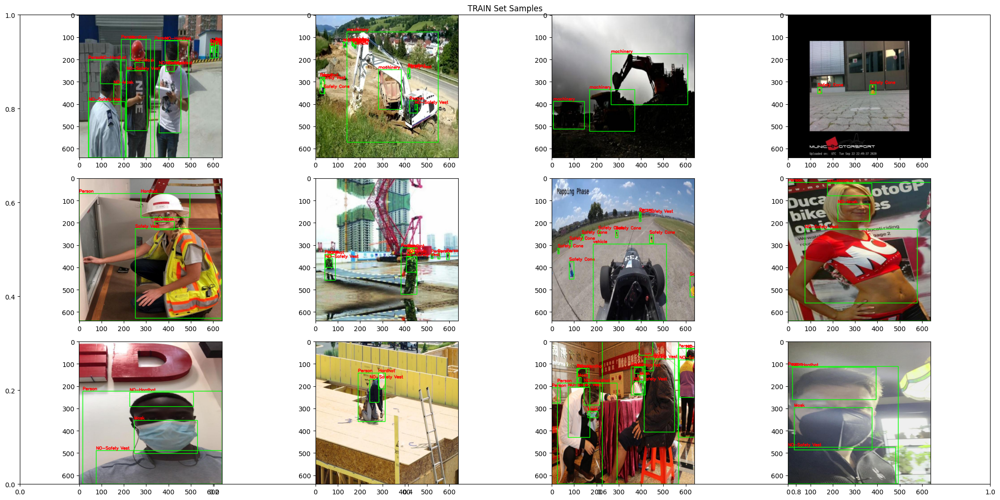

In [27]:
visualize_samples(mode = 'train', n_samples = 12)

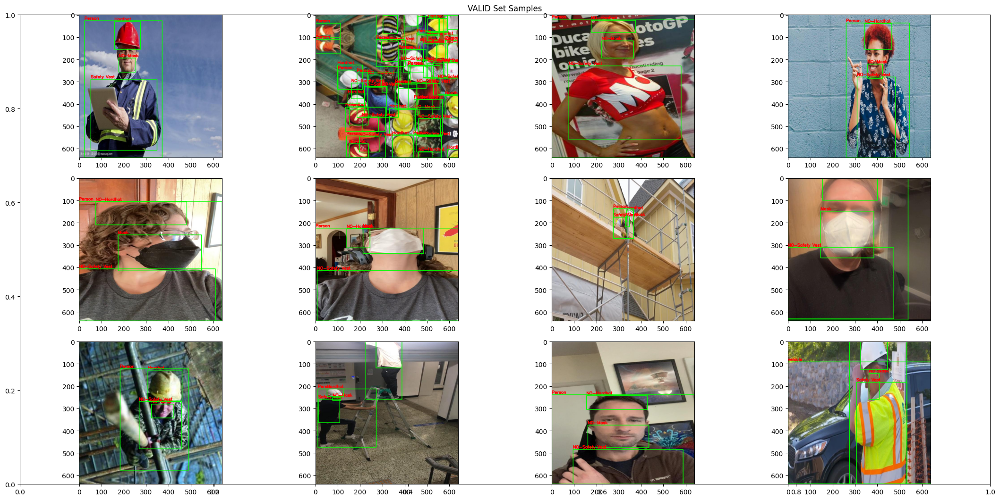

In [28]:
visualize_samples(mode = 'valid', n_samples = 12)

# 🧑‍💻 👓Run Custom Object Detection Model
Após a visualização do conjunto de dados, é hora de treinar nossa detecção de objetos personalizada. Usaremos YoloV8 para treinar nosso modelo de detecção de objetos personalizado.


## Create YAML file
Criaremos um arquivo YAML que será usado pelo CLI do YoloV8 para obter informações. Ele menciona os diretórios `train`, `valid`, `test` e o `nc` (número de classes) para treinar o modelo.


In [29]:
# import yaml
# ppe_data = dict(train = train_path,
#                     val = valid_path,
#                     test = test_path,
#                    nc = len(class_names),
#                    names = class_names)
# with open('ppe_data.yaml', 'w') as output:
#     yaml.dump(ppe_data, output, default_flow_style = True)

## Train a custom model
Usaremos o comando da Interface de Linha de Comando (CLI) para treinar um modelo personalizado usando YoloV8. Os argumentos fornecidos dependem de nossas tarefas e treinamento. Treinaremos o modelo por 250 épocas em um modelo pré-treinado (nos dados COCO128) para nosso conjunto de dados de Detecção de EPI.


In [30]:
#Fazer isso com a lib do python
import torch

class TrainModel:
    def __init__(self, model_path):
        self.model = YOLO(model_path)
        self.results = None
    
    def train(self, data, epochs):
        # Continuar o treinamento se 'resume' for True
        results = self.model.train(data=data, epochs=epochs)
        return results
    
    def val(self):
        self.results = self.model.val()
        results = self.results
        return results
    
    def plot_results(self):
        if self.results is None:
            print("No results available to plot.")
        else:
            print("Results: ", self.results)
            if hasattr(self.results, 'plot'):
                self.results.plot()
                plt.show()
            else:
                print("The results object does not have a 'plot' method.")
    
    def export(self, format):
        success = self.model.export(format=format)
        return success

In [31]:
model_path = 'yolov8n.pt'
train_model = TrainModel(model_path)
#Apenas tirar o comentário quando for treinar
results = train_model.train(data='ppe_data.yaml', epochs=100)


New https://pypi.org/project/ultralytics/8.3.20 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.19  Python-3.12.3 torch-2.4.1+cpu CPU (13th Gen Intel Core(TM) i5-13450HX)
engine\trainer: task=detect, mode=train, model=yolov8n.pt, data=ppe_data.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train10, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=Fa

train: Scanning D:\IA\RNA-Yolov8_EPI-main\RNA-Yolov8_EPI-main\datasets\css_data\train\labels.cache... 2605 images, 6 backgrounds, 0 corrupt: 100%|██████████| 2605/2605 [00:00<?, ?it/s]

train: WARNING  D:\IA\RNA-Yolov8_EPI-main\RNA-Yolov8_EPI-main\datasets\css_data\train\images\004720_jpg.rf.afc486560a4004c7cfd67910af31a29c.jpg: 1 duplicate labels removed
train: WARNING  D:\IA\RNA-Yolov8_EPI-main\RNA-Yolov8_EPI-main\datasets\css_data\train\images\construction-813-_jpg.rf.b085952261fd98f2e76b8065de149b5f.jpg: 1 duplicate labels removed



val: Scanning D:\IA\RNA-Yolov8_EPI-main\RNA-Yolov8_EPI-main\datasets\css_data\valid\labels.cache... 114 images, 10 backgrounds, 0 corrupt: 100%|██████████| 114/114 [00:00<?, ?it/s]


Plotting labels to runs\detect\train10\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added 
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs\detect\train10
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100         0G      1.386      2.783      1.488        313        640: 100%|██████████| 163/163 [07:29<00:00,  2.76s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:09<00:00,  2.37s/it]

                   all        114        697      0.464      0.373      0.376      0.171



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100         0G      1.313      1.857       1.45        313        640: 100%|██████████| 163/163 [06:53<00:00,  2.54s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:07<00:00,  1.98s/it]

                   all        114        697      0.474      0.432      0.402      0.189



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100         0G      1.263      1.708      1.421        280        640: 100%|██████████| 163/163 [06:51<00:00,  2.52s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:07<00:00,  1.90s/it]

                   all        114        697      0.574      0.444      0.476      0.208



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100         0G      1.247      1.609      1.396        231        640: 100%|██████████| 163/163 [06:28<00:00,  2.38s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.73s/it]

                   all        114        697      0.679        0.5      0.546      0.255



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100         0G       1.21      1.537      1.372        291        640: 100%|██████████| 163/163 [06:21<00:00,  2.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.72s/it]

                   all        114        697      0.603      0.485      0.519      0.223



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100         0G      1.189      1.455      1.353        290        640: 100%|██████████| 163/163 [06:23<00:00,  2.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.69s/it]

                   all        114        697      0.686      0.557      0.597       0.27



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100         0G      1.184      1.425      1.347        266        640: 100%|██████████| 163/163 [06:28<00:00,  2.38s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:07<00:00,  1.82s/it]

                   all        114        697      0.687       0.51      0.576      0.279



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100         0G      1.158      1.366      1.328        374        640: 100%|██████████| 163/163 [06:40<00:00,  2.46s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:07<00:00,  1.79s/it]

                   all        114        697      0.742      0.503      0.575      0.253



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100         0G      1.156      1.339      1.326        296        640: 100%|██████████| 163/163 [06:36<00:00,  2.43s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.74s/it]

                   all        114        697      0.703      0.556       0.59      0.295



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100         0G      1.127      1.292      1.304        262        640: 100%|██████████| 163/163 [06:34<00:00,  2.42s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.67s/it]

                   all        114        697      0.714      0.593      0.624      0.283



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100         0G      1.115      1.254      1.296        289        640: 100%|██████████| 163/163 [06:21<00:00,  2.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.74s/it]

                   all        114        697      0.659      0.579      0.596       0.29



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100         0G      1.115      1.237      1.292        181        640: 100%|██████████| 163/163 [06:23<00:00,  2.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.68s/it]

                   all        114        697      0.756      0.603      0.642      0.315



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100         0G      1.098      1.214      1.282        276        640: 100%|██████████| 163/163 [06:21<00:00,  2.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.70s/it]

                   all        114        697      0.751      0.592      0.646      0.334



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100         0G      1.102      1.194       1.28        196        640: 100%|██████████| 163/163 [06:22<00:00,  2.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.70s/it]

                   all        114        697      0.732      0.573      0.645        0.3



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100         0G      1.086      1.169      1.265        301        640: 100%|██████████| 163/163 [06:24<00:00,  2.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.70s/it]

                   all        114        697      0.804      0.587      0.657      0.345



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100         0G      1.072      1.144      1.258        238        640: 100%|██████████| 163/163 [06:25<00:00,  2.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.70s/it]

                   all        114        697      0.813      0.607      0.674      0.338



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100         0G      1.065      1.111      1.251        335        640: 100%|██████████| 163/163 [06:22<00:00,  2.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.68s/it]

                   all        114        697      0.792        0.6      0.664      0.318



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100         0G      1.059      1.115      1.253        184        640: 100%|██████████| 163/163 [06:21<00:00,  2.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.69s/it]

                   all        114        697      0.767      0.585       0.65      0.336



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100         0G      1.051      1.081       1.24        307        640: 100%|██████████| 163/163 [06:21<00:00,  2.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.72s/it]

                   all        114        697      0.841      0.611        0.7      0.358



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100         0G      1.057      1.078      1.242        229        640: 100%|██████████| 163/163 [06:24<00:00,  2.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.71s/it]

                   all        114        697      0.754      0.633       0.68      0.362



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100         0G      1.038      1.053       1.23        320        640: 100%|██████████| 163/163 [06:22<00:00,  2.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.66s/it]

                   all        114        697      0.827      0.594      0.683      0.353



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100         0G      1.034      1.033      1.226        242        640: 100%|██████████| 163/163 [06:24<00:00,  2.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.73s/it]

                   all        114        697      0.765      0.645      0.693      0.363



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100         0G      1.026      1.031       1.22        256        640: 100%|██████████| 163/163 [06:21<00:00,  2.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.68s/it]

                   all        114        697      0.798      0.627      0.698      0.355



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100         0G      1.017      1.014      1.218        228        640: 100%|██████████| 163/163 [06:23<00:00,  2.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.74s/it]

                   all        114        697      0.746      0.639      0.688      0.381



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100         0G      1.005      1.002      1.214        217        640: 100%|██████████| 163/163 [06:21<00:00,  2.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.70s/it]

                   all        114        697      0.794      0.623      0.683      0.352



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100         0G      1.011     0.9916      1.212        271        640: 100%|██████████| 163/163 [06:23<00:00,  2.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.69s/it]

                   all        114        697       0.82      0.633      0.703      0.376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100         0G      1.003     0.9784      1.203        252        640: 100%|██████████| 163/163 [06:21<00:00,  2.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.67s/it]

                   all        114        697      0.842      0.648      0.711      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100         0G     0.9955     0.9685      1.204        181        640: 100%|██████████| 163/163 [06:27<00:00,  2.37s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.69s/it]

                   all        114        697      0.844      0.627      0.699      0.367



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100         0G     0.9943     0.9656      1.202        233        640: 100%|██████████| 163/163 [06:31<00:00,  2.40s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.69s/it]

                   all        114        697      0.849      0.629      0.712      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100         0G     0.9906     0.9469      1.197        281        640: 100%|██████████| 163/163 [06:30<00:00,  2.39s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.69s/it]

                   all        114        697      0.797      0.663      0.714      0.381



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100         0G     0.9838     0.9343      1.189        205        640: 100%|██████████| 163/163 [06:31<00:00,  2.40s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.69s/it]

                   all        114        697      0.822      0.627      0.705      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100         0G     0.9681     0.9161      1.184        321        640: 100%|██████████| 163/163 [06:29<00:00,  2.39s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.68s/it]

                   all        114        697      0.824      0.673      0.733      0.418



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100         0G     0.9683     0.9102      1.178        389        640: 100%|██████████| 163/163 [06:29<00:00,  2.39s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.67s/it]

                   all        114        697      0.867      0.617      0.721      0.396



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100         0G     0.9486      0.891      1.169        214        640: 100%|██████████| 163/163 [06:32<00:00,  2.41s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.68s/it]

                   all        114        697      0.842      0.651      0.739      0.406



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100         0G     0.9627     0.8999      1.176        297        640: 100%|██████████| 163/163 [06:31<00:00,  2.40s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.68s/it]

                   all        114        697      0.856      0.658      0.732      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100         0G     0.9588     0.8891      1.172        245        640: 100%|██████████| 163/163 [06:30<00:00,  2.40s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.69s/it]

                   all        114        697      0.835      0.658      0.728      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100         0G      0.956     0.9001      1.174        293        640: 100%|██████████| 163/163 [06:28<00:00,  2.39s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.68s/it]

                   all        114        697      0.843      0.674      0.745      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100         0G     0.9491     0.8804      1.167        233        640: 100%|██████████| 163/163 [06:31<00:00,  2.40s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.68s/it]

                   all        114        697      0.856      0.658      0.737       0.42



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100         0G     0.9426     0.8752      1.164        276        640: 100%|██████████| 163/163 [06:31<00:00,  2.40s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.67s/it]

                   all        114        697      0.838      0.654      0.722      0.398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100         0G     0.9392     0.8666      1.163        231        640: 100%|██████████| 163/163 [06:31<00:00,  2.40s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.69s/it]

                   all        114        697      0.837      0.683      0.744      0.437



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100         0G     0.9393     0.8705      1.163        177        640: 100%|██████████| 163/163 [06:30<00:00,  2.39s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.69s/it]

                   all        114        697       0.85      0.673      0.739      0.418



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100         0G     0.9318     0.8506      1.157        325        640: 100%|██████████| 163/163 [06:32<00:00,  2.41s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.64s/it]

                   all        114        697      0.854      0.683      0.746      0.433



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100         0G     0.9282     0.8417      1.155        303        640: 100%|██████████| 163/163 [06:31<00:00,  2.40s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.67s/it]

                   all        114        697      0.864       0.67      0.749       0.43



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100         0G     0.9227     0.8384       1.15        271        640: 100%|██████████| 163/163 [06:32<00:00,  2.41s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.66s/it]

                   all        114        697      0.871      0.666      0.747      0.431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100         0G     0.9282     0.8442      1.153        268        640: 100%|██████████| 163/163 [06:31<00:00,  2.40s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.66s/it]

                   all        114        697      0.877      0.671       0.75      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100         0G      0.924     0.8414      1.154        223        640: 100%|██████████| 163/163 [06:28<00:00,  2.39s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.67s/it]

                   all        114        697      0.859      0.675      0.748      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100         0G     0.9144     0.8329      1.148        261        640: 100%|██████████| 163/163 [06:29<00:00,  2.39s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.72s/it]

                   all        114        697      0.867       0.65      0.746      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100         0G     0.9133     0.8125       1.14        347        640: 100%|██████████| 163/163 [06:34<00:00,  2.42s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.67s/it]

                   all        114        697      0.872      0.678       0.76      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100         0G     0.9003     0.8063      1.134        272        640: 100%|██████████| 163/163 [06:30<00:00,  2.40s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.67s/it]

                   all        114        697      0.868      0.685      0.773      0.445



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100         0G     0.9005      0.801      1.131        273        640: 100%|██████████| 163/163 [06:33<00:00,  2.41s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.67s/it]

                   all        114        697      0.878      0.683      0.772       0.43



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100         0G     0.8984     0.8039      1.133        366        640: 100%|██████████| 163/163 [06:32<00:00,  2.41s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.66s/it]

                   all        114        697      0.874      0.681      0.763      0.451



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100         0G     0.8895     0.7902      1.128        210        640: 100%|██████████| 163/163 [06:31<00:00,  2.40s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.63s/it]

                   all        114        697      0.845       0.68      0.756      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100         0G     0.8949     0.7967      1.131        243        640: 100%|██████████| 163/163 [06:30<00:00,  2.39s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.69s/it]

                   all        114        697      0.882      0.681      0.773      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100         0G     0.8928     0.7928      1.132        218        640: 100%|██████████| 163/163 [06:33<00:00,  2.41s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.67s/it]

                   all        114        697      0.843      0.714      0.785       0.44



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100         0G     0.8823     0.7839      1.127        294        640: 100%|██████████| 163/163 [06:29<00:00,  2.39s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.66s/it]

                   all        114        697      0.882      0.681      0.774       0.45



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100         0G     0.8859     0.7723      1.123        286        640: 100%|██████████| 163/163 [06:33<00:00,  2.41s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.66s/it]

                   all        114        697      0.865      0.694      0.786      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100         0G     0.8764      0.772      1.124        208        640: 100%|██████████| 163/163 [06:32<00:00,  2.40s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.68s/it]

                   all        114        697       0.87      0.683      0.771      0.458



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100         0G     0.8817     0.7726      1.122        257        640: 100%|██████████| 163/163 [06:32<00:00,  2.41s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.68s/it]

                   all        114        697      0.867      0.701      0.786      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100         0G     0.8679     0.7618      1.115        206        640: 100%|██████████| 163/163 [06:31<00:00,  2.40s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.67s/it]

                   all        114        697      0.893      0.689       0.78      0.461



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100         0G       0.87     0.7563      1.114        327        640: 100%|██████████| 163/163 [06:32<00:00,  2.41s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.66s/it]

                   all        114        697       0.88      0.691      0.772      0.457



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100         0G     0.8671      0.751      1.115        322        640: 100%|██████████| 163/163 [06:31<00:00,  2.40s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.65s/it]

                   all        114        697      0.865      0.709      0.788      0.469



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100         0G     0.8631     0.7527      1.112        254        640: 100%|██████████| 163/163 [06:29<00:00,  2.39s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.66s/it]

                   all        114        697      0.887      0.704      0.786      0.464



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100         0G     0.8574     0.7462      1.112        196        640: 100%|██████████| 163/163 [06:31<00:00,  2.40s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:07<00:00,  1.77s/it]

                   all        114        697      0.863      0.715      0.793      0.468



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100         0G     0.8477     0.7415       1.11        248        640: 100%|██████████| 163/163 [06:30<00:00,  2.40s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.71s/it]

                   all        114        697      0.885      0.705      0.781      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100         0G     0.8587     0.7362      1.107        269        640: 100%|██████████| 163/163 [06:32<00:00,  2.41s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.66s/it]

                   all        114        697      0.899      0.709      0.791       0.45



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100         0G     0.8529     0.7376      1.107        284        640: 100%|██████████| 163/163 [06:30<00:00,  2.40s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.67s/it]

                   all        114        697      0.897      0.714      0.794      0.473



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100         0G     0.8488     0.7259      1.101        186        640: 100%|██████████| 163/163 [06:32<00:00,  2.41s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.67s/it]

                   all        114        697      0.891      0.704      0.789      0.474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100         0G     0.8546     0.7321      1.103        346        640: 100%|██████████| 163/163 [06:31<00:00,  2.40s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.67s/it]

                   all        114        697      0.869      0.701      0.779      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100         0G     0.8434     0.7185      1.099        277        640: 100%|██████████| 163/163 [06:30<00:00,  2.40s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.67s/it]

                   all        114        697      0.898      0.699      0.802      0.469



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100         0G     0.8416     0.7223      1.096        271        640: 100%|██████████| 163/163 [06:32<00:00,  2.41s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.66s/it]

                   all        114        697      0.889      0.704      0.791      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100         0G     0.8329     0.7164      1.091        226        640: 100%|██████████| 163/163 [06:30<00:00,  2.39s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.67s/it]

                   all        114        697      0.884      0.712      0.793      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100         0G     0.8358     0.7118      1.099        292        640: 100%|██████████| 163/163 [06:31<00:00,  2.40s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.67s/it]

                   all        114        697      0.885      0.706      0.789      0.475



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100         0G     0.8281     0.7101      1.094        159        640: 100%|██████████| 163/163 [06:30<00:00,  2.39s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.68s/it]

                   all        114        697      0.889      0.717      0.791      0.471



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100         0G     0.8256     0.7032      1.092        299        640: 100%|██████████| 163/163 [06:30<00:00,  2.39s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.66s/it]

                   all        114        697      0.909      0.706      0.805      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100         0G     0.8252     0.7005      1.088        271        640: 100%|██████████| 163/163 [06:30<00:00,  2.40s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.65s/it]

                   all        114        697      0.882      0.712      0.791      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100         0G     0.8213     0.6961      1.088        351        640: 100%|██████████| 163/163 [06:31<00:00,  2.40s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.65s/it]

                   all        114        697      0.889      0.712      0.788      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100         0G     0.8239     0.6944      1.084        264        640: 100%|██████████| 163/163 [06:31<00:00,  2.40s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.67s/it]

                   all        114        697      0.904      0.709      0.799       0.48



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100         0G     0.8124     0.6907      1.082        304        640: 100%|██████████| 163/163 [06:28<00:00,  2.39s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.67s/it]

                   all        114        697      0.882      0.707      0.793      0.484



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100         0G     0.8114     0.6816      1.079        392        640: 100%|██████████| 163/163 [06:31<00:00,  2.40s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.64s/it]

                   all        114        697      0.901      0.705      0.797      0.487



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100         0G     0.8144     0.6822      1.081        269        640: 100%|██████████| 163/163 [06:29<00:00,  2.39s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.65s/it]

                   all        114        697      0.875      0.704       0.79      0.484



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100         0G     0.8056     0.6792      1.079        474        640: 100%|██████████| 163/163 [06:29<00:00,  2.39s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.66s/it]

                   all        114        697      0.882       0.71      0.797      0.482



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100         0G     0.7973     0.6751      1.074        251        640: 100%|██████████| 163/163 [06:29<00:00,  2.39s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.68s/it]

                   all        114        697      0.874      0.714      0.796      0.481



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100         0G     0.8025     0.6774      1.074        250        640: 100%|██████████| 163/163 [06:31<00:00,  2.40s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.67s/it]

                   all        114        697      0.898      0.707      0.791      0.486



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100         0G      0.799     0.6738      1.073        182        640: 100%|██████████| 163/163 [06:31<00:00,  2.40s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.66s/it]

                   all        114        697      0.858      0.727      0.794      0.492



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100         0G     0.7901     0.6589       1.07        336        640: 100%|██████████| 163/163 [06:31<00:00,  2.40s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.65s/it]

                   all        114        697      0.898      0.712      0.799      0.488



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100         0G     0.7958     0.6675       1.07        290        640: 100%|██████████| 163/163 [06:31<00:00,  2.40s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.65s/it]

                   all        114        697      0.873       0.73      0.798      0.486



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100         0G     0.7972     0.6612      1.067        237        640: 100%|██████████| 163/163 [06:32<00:00,  2.41s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.67s/it]

                   all        114        697      0.907      0.725      0.801      0.494



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100         0G     0.7845     0.6585      1.066        280        640: 100%|██████████| 163/163 [06:34<00:00,  2.42s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.65s/it]

                   all        114        697      0.905       0.72      0.809      0.497



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100         0G     0.7839     0.6529      1.064        325        640: 100%|██████████| 163/163 [06:32<00:00,  2.41s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.66s/it]

                   all        114        697      0.905       0.72      0.809      0.493



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100         0G     0.7887     0.6558      1.069        355        640: 100%|██████████| 163/163 [06:33<00:00,  2.42s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.67s/it]

                   all        114        697      0.881      0.731      0.805      0.486


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100         0G     0.7973     0.5953      1.067        195        640: 100%|██████████| 163/163 [06:18<00:00,  2.32s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.67s/it]

                   all        114        697      0.889      0.714      0.797       0.48



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100         0G     0.7842     0.5693      1.056        172        640: 100%|██████████| 163/163 [06:18<00:00,  2.32s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.68s/it]

                   all        114        697       0.88      0.715      0.794      0.489



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100         0G     0.7682     0.5588      1.053        174        640: 100%|██████████| 163/163 [06:20<00:00,  2.33s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.69s/it]

                   all        114        697      0.906      0.731      0.802      0.493



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100         0G      0.761     0.5562      1.047        217        640: 100%|██████████| 163/163 [06:17<00:00,  2.32s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.68s/it]

                   all        114        697      0.903       0.72      0.804      0.494



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100         0G     0.7621     0.5514       1.05        154        640: 100%|██████████| 163/163 [06:17<00:00,  2.32s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.67s/it]

                   all        114        697       0.91      0.719      0.806      0.494



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100         0G     0.7603      0.552      1.046        193        640: 100%|██████████| 163/163 [06:19<00:00,  2.33s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.66s/it]

                   all        114        697      0.892      0.723      0.801      0.501



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100         0G     0.7552     0.5501      1.043        161        640: 100%|██████████| 163/163 [06:19<00:00,  2.33s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.68s/it]

                   all        114        697       0.89      0.734       0.81      0.505



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100         0G     0.7493     0.5427      1.042        172        640: 100%|██████████| 163/163 [06:19<00:00,  2.33s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.70s/it]

                   all        114        697      0.903      0.729      0.809        0.5



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100         0G     0.7473     0.5415      1.042        151        640: 100%|██████████| 163/163 [06:19<00:00,  2.33s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.69s/it]

                   all        114        697      0.908      0.725      0.806      0.502



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100         0G      0.747     0.5382      1.041        127        640: 100%|██████████| 163/163 [06:18<00:00,  2.32s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.70s/it]

                   all        114        697      0.897      0.734      0.806      0.501



100 epochs completed in 11.017 hours.
Optimizer stripped from runs\detect\train10\weights\last.pt, 6.3MB
Optimizer stripped from runs\detect\train10\weights\best.pt, 6.3MB

Validating runs\detect\train10\weights\best.pt...
Ultralytics 8.3.19  Python-3.12.3 torch-2.4.1+cpu CPU (13th Gen Intel Core(TM) i5-13450HX)
Model summary (fused): 168 layers, 3,007,598 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:05<00:00,  1.42s/it]


                   all        114        697      0.893      0.734       0.81      0.505
               Hardhat         42         79      0.882      0.797      0.878      0.591
                  Mask         19         21      0.989      0.905      0.935      0.657
            NO-Hardhat         37         69      0.956      0.551      0.687      0.377
               NO-Mask         44         74      0.883      0.595      0.663       0.35
        NO-Safety Vest         56        106      0.895       0.67        0.8      0.466
                Person         84        166      0.915      0.759      0.854      0.541
           Safety Cone         13         44      0.917      0.886      0.892      0.448
           Safety Vest         28         41      0.863      0.805      0.902        0.6
             machinery         26         55      0.867      0.873      0.936       0.67
               vehicle         16         42      0.762        0.5      0.548      0.351
Speed: 0.8ms preproce

## Visualizar resultados

In [32]:
train_results_path = './runs/detect/train10/'
csv_results = train_results_path + 'results.csv'
image_results = train_results_path + '*.*'
df_results = pd.read_csv(csv_results)
df_results

,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
0,1,461.634,1.38621,2.78254,1.48795,0.46420,0.37257,0.37594,0.17099,1.83897,2.47082,1.79964,0.000237,0.000237,0.000237
1,2,883.240,1.31338,1.85661,1.44980,0.47400,0.43200,0.40224,0.18904,1.82948,2.24024,1.86521,0.000470,0.000470,0.000470
2,3,1302.200,1.26330,1.70833,1.42088,0.57351,0.44380,0.47564,0.20842,1.94280,2.12454,1.92386,0.000698,0.000698,0.000698
3,4,1697.790,1.24679,1.60942,1.39600,0.67938,0.50003,0.54637,0.25548,1.79654,1.85642,1.82908,0.000693,0.000693,0.000693
4,5,2086.350,1.21034,1.53705,1.37154,0.60301,0.48496,0.51887,0.22347,1.93888,1.92125,1.98471,0.000686,0.000686,0.000686
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,96,38116.500,0.76027,0.55197,1.04581,0.89157,0.72320,0.80100,0.50107,1.31342,0.78514,1.41549,0.000042,0.000042,0.000042
96,97,38503.500,0.75516,0.55007,1.04308,0.89037,0.73421,0.80955,0.50518,1.31511,0.77884,1.41976,0.000035,0.000035,0.000035
97,98,38889.600,0.74930,0.54274,1.04214,0.90300,0.72899,0.80863,0.50003,1.32405,0.77349,1.42527,0.000028,0.000028,0.000028
98,99,39275.700,0.74728,0.54150,1.04217,0.90803,0.72541,0.80561,0.50192,1.31916,0.77101,1.42376,0.000021,0.000021,0.000021


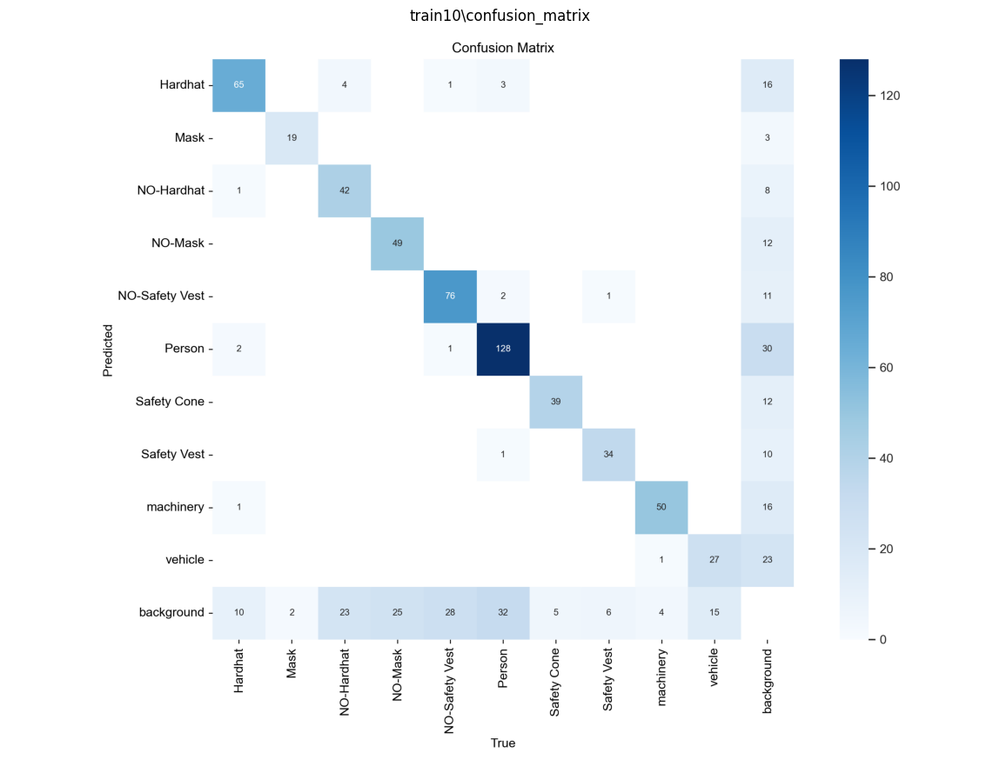

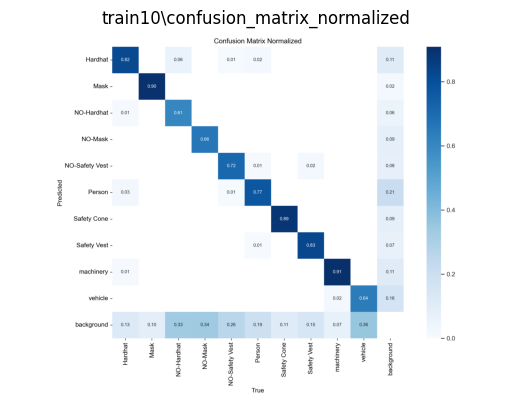

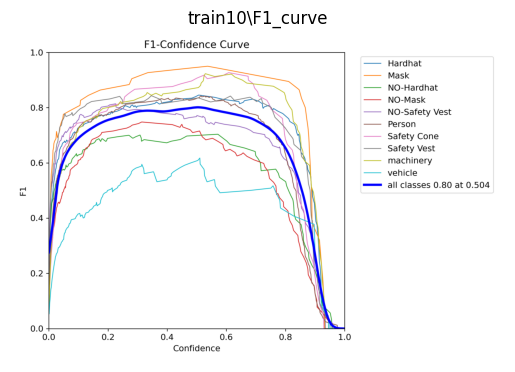

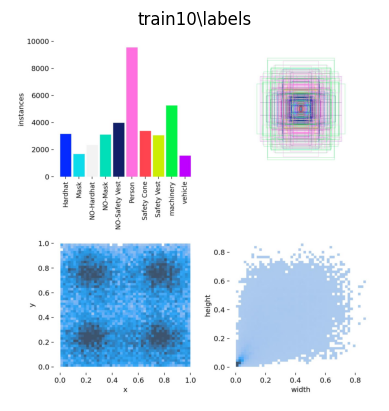

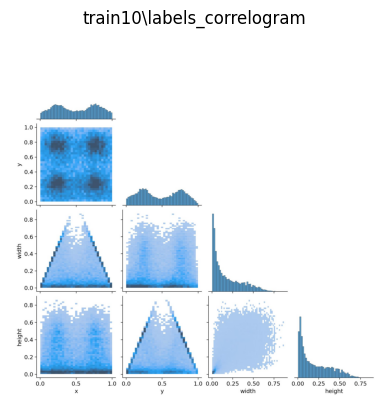

...

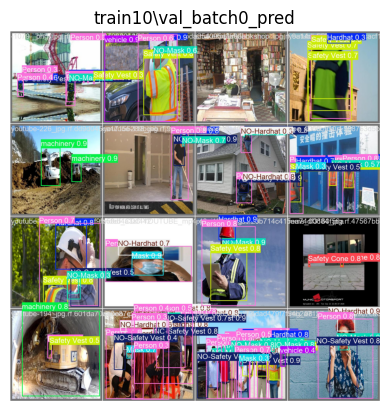

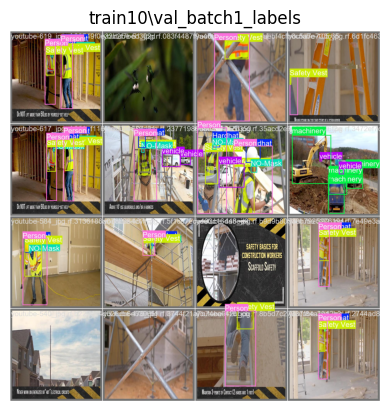

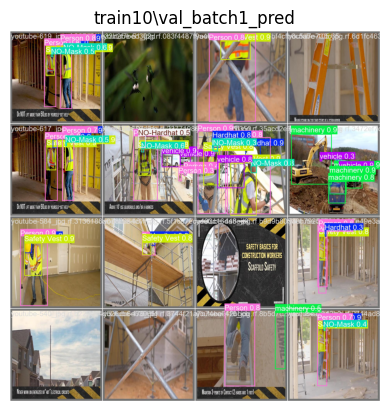

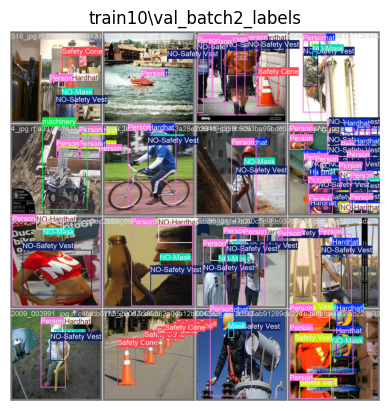

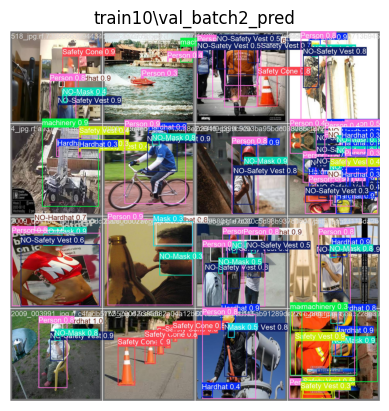

In [33]:
# Ajusta o tamanho da figura
plt.figure(figsize=(21, 11))

# Loop para carregar e exibir cada imagem
for result in glob.glob(image_results):
    ext = result.split('/')[-1].split('.')[-1]
    if ext in ['jpg', 'jpeg', 'png']:
        image = Image.open(result)
        image = np.array(image)
        plt.imshow(image)
        plt.title(result.split('/')[-1].split('.')[0])
        plt.axis('off')  # Remove os eixos
        plt.show()

In [34]:
class EPIApp(QWidget):
    def __init__(self):
        super().__init__()
        
        self.setWindowTitle("Verificação de EPIs")
        self.setGeometry(100, 100, 800, 600)

        # Modelo YOLO carregado
        best_model = best_model = train_results_path + '/weights/best.pt'


        self.model = YOLO(best_model)
        
        # Layout
        layout = QVBoxLayout()

        # Rótulo para exibir o feed da câmera
        self.label = QLabel(self)
        layout.addWidget(self.label)

        # Botão para verificar e "bater ponto"
        self.button = QPushButton("Verificar EPIs", self)
        self.button.clicked.connect(self.on_bater_ponto)
        layout.addWidget(self.button)

        # Definir o layout principal
        self.setLayout(layout)

        # Iniciar captura da câmera
        self.capture = cv2.VideoCapture(0)
        self.timer_id = self.startTimer(100)  # Atualizar a cada 100ms

    def timerEvent(self, event):
        # Atualizar o frame da câmera
        ret, frame = self.capture.read()
        if ret:
            frame_resized = cv2.resize(frame, (640, 480))
            
            # Detectar EPIs e desenhar as caixas delimitadoras
            frame_with_detections = self.detect_epi(frame_resized)

            # Converter imagem para formato RGB (PyQt usa RGB, OpenCV usa BGR)
            rgb_image = cv2.cvtColor(frame_with_detections, cv2.COLOR_BGR2RGB)
            height, width, channel = rgb_image.shape
            bytes_per_line = 3 * width
            qt_image = QImage(rgb_image.data, width, height, bytes_per_line, QImage.Format.Format_RGB888)
            
            # Exibir a imagem na interface
            self.label.setPixmap(QPixmap.fromImage(qt_image))

    def detect_epi(self, frame):
        # Realizar predição no frame capturado
        results = self.model(frame)

        # Iterar sobre cada detecção
        for result in results[0].boxes:
            # Extrair coordenadas da caixa delimitadora
            x1, y1, x2, y2 = map(int, result.xyxy[0])

            # Extrair o rótulo da classe
            label = self.model.names[int(result.cls[0])]

            # Escolher a cor da caixa: verde para EPIs e vermelho para itens como "NO-mask"
            if "NO-" in label:  # Ajuste baseado nos rótulos do modelo
                color = (0, 0, 255)  # Vermelho (BGR)
            else:
                color = (0, 255, 0)  # Verde (BGR)

            # Desenhar a caixa delimitadora no frame
            cv2.rectangle(frame, (x1, y1), (x2, y2), color, 2)

            # Adicionar o rótulo da classe acima da caixa delimitadora
            cv2.putText(frame, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, color, 2)

        return frame

    def on_bater_ponto(self):
        ret, frame = self.capture.read()
        if ret:
            # Verificar EPIs
            results = self.model(frame)
            if self.check_all_epis_present(results):
                self.show_logged_in_window()
            else:
                QMessageBox.critical(self, "Erro", "Faltam equipamentos de proteção!")

    def check_all_epis_present(self, results):
        classes_presentes = [int(result.cls[0].item()) for result in results[0].boxes]
        if any("NO-" in self.model.names[classe] for classe in classes_presentes):
            return False
        return True

    def show_logged_in_window(self):
        # Criar uma nova janela de "Logado"
        self.logged_in_window = QWidget()
        self.logged_in_window.setWindowTitle("Logado com Sucesso!")
        self.logged_in_window.setGeometry(300, 300, 400, 200)
        
        # Layout da nova janela
        layout = QVBoxLayout()
        label = QLabel("Logado com sucesso!", self.logged_in_window)
        layout.addWidget(label)
        
        self.logged_in_window.setLayout(layout)
        self.logged_in_window.show()  # Exibir a nova janela
        self.close()  # Fechar a janela atual

    def closeEvent(self, event):
        # Limpar a captura da câmera ao fechar a janela
        self.capture.release()
        cv2.destroyAllWindows()

In [35]:
if __name__ == "__main__":
    app = QApplication(sys.argv)
    window = EPIApp()
    window.show()
    sys.exit(app.exec())


0: 480x640 (no detections), 124.9ms
Speed: 2.0ms preprocess, 124.9ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 NO-Hardhat, 1 NO-Mask, 2 Persons, 53.9ms
Speed: 1.0ms preprocess, 53.9ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 NO-Hardhat, 1 NO-Mask, 2 Persons, 79.5ms
Speed: 4.0ms preprocess, 79.5ms inference, 0.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 NO-Hardhat, 1 NO-Mask, 3 Persons, 66.4ms
Speed: 2.0ms preprocess, 66.4ms inference, 0.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 NO-Hardhat, 1 NO-Mask, 2 Persons, 47.9ms
Speed: 3.0ms preprocess, 47.9ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 NO-Hardhat, 1 NO-Mask, 1 Person, 46.9ms
Speed: 0.9ms preprocess, 46.9ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 NO-Hardhat, 1 NO-Mask, 1 NO-Safety Vest, 1 Person, 64.4ms
Speed: 4.0ms preprocess, 64.4ms in

SystemExit: 0

In [28]:
## One liner for the above code
# We can also use list comprehension for this
